# 6 Train Model

## 6.1 Install and load libraries

In [ ]:
!pip install wandb
!pip install sklearn
!pip install keras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.8 MB 6.9 MB/s 
     |████████████████████████████████| 153 kB 40.3 MB/s 
     |████████████████████████████████| 181 kB 25.8 MB/s 
     |████████████████████████████████| 63 kB 1.6 MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=7e4bb6dade303e7458a78bfa2b713ffd9c5e4c678ac0a9f52273a21aa3614eed
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built pathtools
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import logging
import wandb
import pandas as pd
import numpy as np
import joblib
import matplotlib.pyplot as plt

import tensorflow as tf

from tensorflow import feature_column
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2
from tensorflow.keras.constraints import unit_norm
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.neighbors import LocalOutlierFactor
#from sklearn.preprocessing import LabelEncoder
#from sklearn.preprocessing import OneHotEncoder
#from sklearn.base import BaseEstimator, TransformerMixin
#from sklearn.preprocessing import MinMaxScaler
#from sklearn.preprocessing import StandardScaler
#from sklearn.pipeline import Pipeline, FeatureUnion
#from sklearn.tree import DecisionTreeClassifier
#from sklearn.impute import SimpleImputer
from sklearn.metrics import fbeta_score, precision_score, recall_score, accuracy_score
#from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

In [ ]:
!wandb login --relogin

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: ERROR API key must be 40 characters long, yours was 43
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


## 6.2 Holdout Configuration

In [ ]:
# global varaibles

#ratio used to split traind and validation data
val_size = 0.30

# seed used to reproduce purposes
seed = 57

# reference (column) to stratify the data
stratify = "status"

# name of the imput artifact
artifact_input_name = "phishing-detection-2/train.csv:latest"

# type of the artifact
artifact_type = "Train"

# configure logging
logging.basicConfig(level=logging.INFO,
                    format="%(asctime)s %(message)s",
                    datefmt="%Y-%m-%d %H:%M:%S")

# reference for a logging obj
logger = logging.getLogger()

# initiate the wandb project
run = wandb.init(project="phishing-detection-2",job_type="train")

logger.info("Downloading and reading the train artifact")
local_path = run.use_artifact(artifact_input_name).file()
df_train = pd.read_csv(local_path)

# Spliting train.csv into train and validation dataset
logger.info("Creating the target variable")

df_train['target'] = np.where(df_train['status']=='legitimate', 0, 1)

logger.info("Droping columns 'status' and 'url'")
df_train = df_train.drop(columns=['status', 'url'])

wandb: Currently logged in as: lupamedeiros. Use `wandb login --relogin` to force relogin


2022-07-19 22:30:06 Downloading and reading the train artifact
2022-07-19 22:30:07 Creating the target variable
2022-07-19 22:30:07 Droping columns 'status' and 'url'


In [ ]:
# Split data into Train and Validation
print(len(df_train))

train, val = np.split(df_train.sample(frac=1), [int((1.-val_size)*len(df_train))])
print(len(train), 'train examples')
print(len(val), 'validation examples')

# Create a tf.data dataset from a Panda Dataset

def df_to_dataset(dataframe, shuffle=True, batch_size=32):
    dataframe = dataframe.copy()
    labels = dataframe.pop('target')
    df = {key: value[:,tf.newaxis] for key, value in dataframe.items()}
    ds = tf.data.Dataset.from_tensor_slices((dict(dataframe), labels))

    if shuffle:
        ds = ds.shuffle(buffer_size=len(dataframe))
    ds = ds.batch(batch_size)
    ds = ds.prefetch(batch_size)
    return ds


9144
6400 train examples
2744 validation examples


In [ ]:
batch_size = 5
train_ds = df_to_dataset(train, batch_size=batch_size)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  del sys.path[0]


In [ ]:
[(train_features, label_batch)] = train_ds.take(1)
print('Every feature:', list(train_features.keys()))
print('A batch of page_rank:', train_features['page_rank'])
print('A batch of status:', label_batch)


Every feature: ['length_url', 'length_hostname', 'ip', 'nb_dots', 'nb_hyphens', 'nb_at', 'nb_qm', 'nb_and', 'nb_or', 'nb_eq', 'nb_underscore', 'nb_tilde', 'nb_percent', 'nb_slash', 'nb_star', 'nb_colon', 'nb_comma', 'nb_semicolumn', 'nb_dollar', 'nb_space', 'nb_www', 'nb_com', 'nb_dslash', 'http_in_path', 'https_token', 'ratio_digits_url', 'ratio_digits_host', 'punycode', 'port', 'tld_in_path', 'tld_in_subdomain', 'abnormal_subdomain', 'nb_subdomains', 'prefix_suffix', 'random_domain', 'shortening_service', 'path_extension', 'nb_redirection', 'nb_external_redirection', 'length_words_raw', 'char_repeat', 'shortest_words_raw', 'shortest_word_host', 'shortest_word_path', 'longest_words_raw', 'longest_word_host', 'longest_word_path', 'avg_words_raw', 'avg_word_host', 'avg_word_path', 'phish_hints', 'domain_in_brand', 'brand_in_subdomain', 'brand_in_path', 'suspecious_tld', 'statistical_report', 'nb_hyperlinks', 'ratio_intHyperlinks', 'ratio_extHyperlinks', 'ratio_nullHyperlinks', 'nb_extCS

## 6.3 Data preparation

### 6.3.1 Outlier Removal


In [ ]:
logger.info("Outlier Removal")

#temporary variable
x = train.select_dtypes("int64").copy()

# identify outlier in the dataset
lof = LocalOutlierFactor()
outlier = lof.fit_predict(x)
mask = outlier != -1

2022-07-17 18:41:07 Outlier Removal


In [ ]:
logger.info("x_train shape [original]: {}".format(train.shape))
logger.info("x_train shape [outlier removal]: {}".format(train.loc[mask,:].shape))

2022-07-17 18:41:11 x_train shape [original]: (6400, 88)
2022-07-17 18:41:11 x_train shape [outlier removal]: (5566, 88)


In [ ]:
# AVOID data leakage and you should not do this procedure in the preprocessing stage
# Note that we did not perform this procedure in the validation set
train = train.loc[mask,:].copy()

In [ ]:
logger.info("Normalization")

def get_normalization_layer(name, dataset):
  # Create a Normalization layer for the feature.
  normalizer = layers.Normalization(axis=None)

  # Prepare a Dataset that only yields the feature.
  feature_ds = dataset.map(lambda x, y: x[name])

  # Learn the statistics of the data.
  normalizer.adapt(feature_ds)

  return normalizer

2022-07-19 22:31:47 Normalization


In [ ]:
page_rank_col = train_features['page_rank']
layer = get_normalization_layer('page_rank', train_ds)
layer(page_rank_col)

<tf.Tensor: shape=(5,), dtype=float32, numpy=
array([-0.06879029, -1.2629702 , -0.06879029, -1.2629702 ,  0.7273296 ],
      dtype=float32)>

### 6.3.2 Encoding target variable

In [ ]:
# Done in HoldOut Configuration

### 6.3.3 Encoding independent variables

All the variables in this problem are int or float, except for the unique ID (url) and the status.



In [ ]:
train.shape

(5591, 88)

In [ ]:
"""cols=['url']

x_train.drop(labels=cols,axis=1,inplace=True)
x_val.drop(labels=cols,axis=1,inplace=True)"""

"cols=['url']\n\nx_train.drop(labels=cols,axis=1,inplace=True)\nx_val.drop(labels=cols,axis=1,inplace=True)"

In [ ]:
#x_train.head()

In [ ]:
#x_val.head()

In [ ]:
run.finish()

### Teste do Tensor Flow

### 6.3.4 Building a full-pipeline

Here we are going to create a full-pipeline to proccess the inputs. Both for training and running.

In order to run properly, it is important to re-run cells at sections:


*   6.2 Holdout Configuration
*   6.3.1 Outlier Removal
*   6.3.2 Encoding Target Variable

<br>

#### 6.3.4.1 Feature Extractor

In [ ]:
# Building the Dataset
batch_size = 256
train_ds = df_to_dataset(train, batch_size=batch_size)
val_ds = df_to_dataset(val, batch_size=batch_size)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  del sys.path[0]


In [ ]:
all_inputs = []
encoded_features = []

numerical_features = train.select_dtypes(["int64","float"]).columns.to_list()
numerical_features.pop()

for header in numerical_features:
    numeric_col = tf.keras.Input(shape=(1,), name=header)
    normalization_layer = get_normalization_layer(header, train_ds)
    encoded_numeric_col = normalization_layer(numeric_col)
    all_inputs.append(numeric_col)
    encoded_features.append(encoded_numeric_col)

In [ ]:
# Create, compile and train the model

all_features = tf.keras.layers.concatenate(encoded_features)
x = tf.keras.layers.Dense(87,activation='tanh')(all_features)
x = tf.keras.layers.Dense(87,activation='tanh')(x)
output = tf.keras.layers.Dense(1,activation='sigmoid')(x)

model = tf.keras.Model(all_inputs, output)

In [ ]:
#model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
#              metrics=["accuracy"])
model.compile(loss=tf.keras.losses.MeanSquaredError(),
              metrics=["accuracy"])

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True, rankdir="LR")

In [ ]:
history = model.fit(train_ds, epochs=20, validation_data=val_ds)
print(history)

Epoch 1/20
22/22 [==============================] - 4s 75ms/step - loss: 0.0192 - accuracy: 0.9757 - val_loss: 0.0373 - val_accuracy: 0.9504
Epoch 2/20
22/22 [==============================] - 1s 26ms/step - loss: 0.0168 - accuracy: 0.9792 - val_loss: 0.0389 - val_accuracy: 0.9497
Epoch 3/20
22/22 [==============================] - 1s 31ms/step - loss: 0.0159 - accuracy: 0.9819 - val_loss: 0.0375 - val_accuracy: 0.9486
Epoch 4/20
22/22 [==============================] - 1s 31ms/step - loss: 0.0150 - accuracy: 0.9831 - val_loss: 0.0360 - val_accuracy: 0.9526
Epoch 5/20
22/22 [==============================] - 1s 31ms/step - loss: 0.0141 - accuracy: 0.9847 - val_loss: 0.0359 - val_accuracy: 0.9523
Epoch 6/20
22/22 [==============================] - 1s 31ms/step - loss: 0.0128 - accuracy: 0.9874 - val_loss: 0.0363 - val_accuracy: 0.9537
Epoch 7/20
22/22 [==============================] - 1s 27ms/step - loss: 0.0132 - accuracy: 0.9845 - val_loss: 0.0364 - val_accuracy: 0.9534
Epoch 8/20
22

In [ ]:
logger.info("Downloading and reading the test artifact")

artifact_input_name = "phishing-detection-2/test.csv:latest"

local_path = run.use_artifact(artifact_input_name).file()
df_test = pd.read_csv(local_path)

df_test['target'] = np.where(df_test['status']=='legitimate', 0., 1.)

logger.info("Droping columns 'status' and 'url'")
df_test = df_test.drop(columns=['status', 'url'])

test_ds = df_to_dataset(df_test)
print(len(df_test))

loss, accuracy = model.evaluate(test_ds)
print("Accuracy:", accuracy)
print("Loss:", loss)

2022-07-17 21:05:09 Downloading and reading the test artifact
2022-07-17 21:05:10 Droping columns 'status' and 'url'
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  del sys.path[0]


2286
72/72 [==============================] - 3s 43ms/step - loss: 0.1549 - accuracy: 0.9506
Accuracy: 0.950568675994873
Loss: 0.15492315590381622


In [ ]:
logger.info("Infering")
predict = model.predict(test_ds)

2022-07-17 18:48:15 Infering


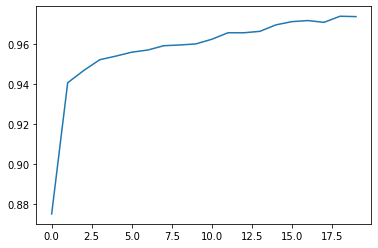

In [ ]:
fig = plt.plot(history.history['accuracy'])
plt.show()

In [ ]:
# close the current run before to execute the next section
run.finish()

## 6.5 Hyperparamenter Tuning and Better Training

In [ ]:
# To see all paramenters fo a specific step of the pipeline
# pipe.named_steps['classifier'].get_params() 
# or
# pipe.named_steps['full_pipeline'].get_params()

In [ ]:
# global seed
seed = 57

In [ ]:
!wandb login --relogin

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
# Defining Functions
def df_to_dataset(dataframe, shuffle=True, batch_size=32):
    dataframe = dataframe.copy()
    labels = dataframe.pop('target')
    df = {key: value[:,tf.newaxis] for key, value in dataframe.items()}
    ds = tf.data.Dataset.from_tensor_slices((dict(dataframe), labels))

    if shuffle:
        ds = ds.shuffle(buffer_size=len(dataframe))
    ds = ds.batch(batch_size)
    ds = ds.prefetch(batch_size)
    return ds

def get_normalization_layer(name, dataset):
  # Create a Normalization layer for the feature.
  normalizer = layers.Normalization(axis=None)

  # Prepare a Dataset that only yields the feature.
  feature_ds = dataset.map(lambda x, y: x[name])

  # Learn the statistics of the data.
  normalizer.adapt(feature_ds)

  return normalizer    

In [ ]:
# Initialize from scratch

# Read TRAIN data ==============================================================

#ratio used to split traind and validation data
val_size = 0.30

# seed used to reproduce purposes
seed = 57

# reference (column) to stratify the data
stratify = "status"

# name of the imput artifact
artifact_input_name = "phishing-detection-2/train.csv:latest"

# type of the artifact
artifact_type = "Train"

# configure logging
logging.basicConfig(level=logging.INFO,
                    format="%(asctime)s %(message)s",
                    datefmt="%Y-%m-%d %H:%M:%S")

# reference for a logging obj
logger = logging.getLogger()

# initiate the wandb project
run = wandb.init(project="phishing-detection-2",job_type="train")

logger.info("Downloading and reading the train artifact")
local_path = run.use_artifact(artifact_input_name).file()
df_train = pd.read_csv(local_path)

# Spliting train.csv into train and validation dataset
logger.info("Creating the target variable")

df_train['target'] = np.where(df_train[stratify]=='legitimate', 0, 1)

logger.info("Droping columns 'status' and 'url'")
df_train = df_train.drop(columns=['status', 'url'])

# Split data into Train and Validation =========================================

train, val = np.split(df_train.sample(frac=1), [int((1.-val_size)*len(df_train))])
logger.info("Train Samples:", len(train))
logger.info("Validation Samples:", len(val))

# Downloading Test Artifact ====================================================

logger.info("Downloading and reading the test artifact")
artifact_input_name = "phishing-detection-2/test.csv:latest"

local_path = run.use_artifact(artifact_input_name).file()
df_test = pd.read_csv(local_path)

df_test['target'] = np.where(df_test[stratify]=='legitimate', 0., 1.)

logger.info("Droping columns 'status' and 'url'")
df_test = df_test.drop(columns=['status', 'url'])

test_ds = df_to_dataset(df_test)
logger.info("Test Samples:", len(df_test))


wandb: Currently logged in as: lupamedeiros. Use `wandb login --relogin` to force relogin


2022-07-23 22:16:10 Downloading and reading the train artifact
2022-07-23 22:16:11 Creating the target variable
2022-07-23 22:16:11 Droping columns 'status' and 'url'
--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_ne

In [ ]:
sweep_config = {
    # try grid or random
    "method": "random",
    "metric": {
        "name": "Test Accuracy",
        "goal" : "maximize"
    },
    "parameters": {
        # Nodes per hidden layer
        "nodes": {
            "values": [22, 44, 87, 174]
        },
        # Hidden Layers
        "layers": {
            "values": [1, 2, 3, 4]
        },
        # Batch Size
        "batch_size": {
            "values": [230, 570, 1143, 2286]
        },
        # Loss Function
        "criterion": {
            "values": ["BinaryCrossentropy", "MeanSquaredError"]
        },
        "optimizer": {
            "values": ["sgd", "adam", "rmsprop", "adagrad"]
        },
        # SGD Learning Rate
        "learning_rate": {
            "values": [0.01, 0.05, 0.1]
        },
        # SGD Momentum
        "momentum": {
            "values": [0.9]
        },
        # L2 vs Dropout
        "overfit_preventing": {
            "values": ["l2", "dropout", "weight_cons"]
        },
        # Node Dropout
        "dropout": {
            "values": [0.2, 0.4]
        },
        # Weights Initializer
        "initializer": {
            "values": ['zeros', 'random']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="phishing-detection-2")

Create sweep with ID: 9oswtnqd
Sweep URL: https://wandb.ai/lupamedeiros/phishing-detection-2/sweeps/9oswtnqd


In [ ]:
def train_func():
    with wandb.init() as run:
        # Building the Dataset -------------------------------------------------
        logger.info('Creating Datasets')
        batch_size = 2286
        train_ds = df_to_dataset(train, batch_size=batch_size)
        val_ds = df_to_dataset(val, batch_size=batch_size)
        test_ds = df_to_dataset(df_test, batch_size=batch_size)

        # Creating the Input Preprocessor --------------------------------------
        logger.info('Creating Preprocessors')
        all_inputs = []
        encoded_features = []

        numerical_features = train.select_dtypes(["int64","float"]).columns.to_list()
        numerical_features.pop() # Remove ['target']

        for header in numerical_features:
            numeric_col = tf.keras.Input(shape=(1,), name=header)
            normalization_layer = get_normalization_layer(header, train_ds)
            encoded_numeric_col = normalization_layer(numeric_col)
            all_inputs.append(numeric_col)
            encoded_features.append(encoded_numeric_col)

        # Create, compile and train the model ----------------------------------
        logger.info('Creating and Compiling the Model')
        all_features = tf.keras.layers.concatenate(encoded_features)

        x = tf.keras.layers.Dense(87,activation='tanh')(all_features)

        for i in range(0, run.config.layers):
        
            init = None

            if run.config.initializer == "random":
                init = tf.keras.initializers.RandomNormal(mean=0,stddev=1)
            elif run.config.initializer == "zeros":
                init = tf.keras.initializers.Zeros()

            if run.config.overfit_preventing == "l2":
                x = tf.keras.layers.Dense(run.config.nodes,
                                          activation='tanh',
                                          kernel_regularizer=l2(0.001),
                                          kernel_initializer=init)(x)
            elif run.config.overfit_preventing == "dropout":
                x = tf.keras.layers.Dense(run.config.nodes,
                                          activation='tanh',
                                          kernel_initializer=init)(x)
                x = tf.keras.layers.Dropout(run.config.dropout)(x)
            elif run.config.overfit_preventing == "weight_cons":
                x = tf.keras.layers.Dense(run.config.nodes,
                                          activation='tanh',
                                          kernel_constraint=unit_norm())(x)

        output = tf.keras.layers.Dense(1,activation='sigmoid')(x)

        model = tf.keras.Model(all_inputs, output)

        lf = None

        if run.config.criterion == "BinaryCrossentropy":
            lf = tf.keras.losses.BinaryCrossentropy()
        elif run.config.criterion == "MeanSquaredError":
            lf = tf.keras.losses.MeanSquaredError()
        
        # Optimizers -----------------------------------------------------------
        opt = run.config.optimizer
        if opt == "sgd": 
            opt = SGD(learning_rate=run.config.learning_rate, momentum=run.config.momentum)
        
        model.compile(loss=lf, metrics=["accuracy"], optimizer=opt)

        # Trainning ------------------------------------------------------------
        es = EarlyStopping(monitor='val_loss',
                           mode='min',
                           verbose=1,
                           patience=10)
        logger.info('Trainning')
        history = model.fit(train_ds,
                            epochs=200,
                            validation_data=val_ds,
                            verbose=0,
                            batch_size=run.config.batch_size,
                            callbacks=[es]
                            )

        # Predict --------------------------------------------------------------
        logger.info("Infering")
        _, train_acc = model.evaluate(train_ds, verbose=0)
        _, val_acc = model.evaluate(val_ds, verbose=0)
        _, test_acc = model.evaluate(test_ds, verbose=0)

        # Creating Figures -----------------------------------------------------
        logger.info("Creating Figures")
        fig, ax = plt.subplots(1,2, figsize=(10,4))

        ax[0].set_title((run.config.criterion + " Loss"), pad=-40)
        ax[0].plot(history.history['loss'], label='train')
        ax[0].plot(history.history['val_loss'], label='val')
        ax[0].legend(loc='best')

        ax[1].set_title(("Accuracy"), pad=-40)
        ax[1].plot(history.history['accuracy'], label='train')
        ax[1].plot(history.history['val_accuracy'], label='val')
        ax[1].legend(loc='best')

        plt.show()
        logger.info("Train Accuracy: {}".format(train_acc))
        logger.info("Val Accuracy: {}".format(val_acc))
        logger.info("Test Accuracy: {}".format(test_acc))

        run.summary["Train Accuracy"] = train_acc
        run.summary["Val Accuracy"] = val_acc
        run.summary["Test Accuracy"] = test_acc

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.
wandb: Agent Starting Run: m3abxmzv with config:
wandb: 	batch_size: 570
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.4
wandb: 	initializer: zeros
wandb: 	layers: 4
wandb: 	learning_rate: 0.05
wandb: 	momentum: 0.9
wandb: 	nodes: 174
wandb: 	optimizer: sgd
wandb: 	overfit_preventing: l2


2022-07-23 18:44:41 Creating Datasets
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  """
2022-07-23 18:44:42 Creating Preprocessors


2022-07-23 18:44:45 5 out of the last 13 calls to <function PreprocessingLayer.make_adapt_function.<locals>.adapt_step at 0x7f909f1f5ef0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


2022-07-23 18:44:46 5 out of the last 13 calls to <function PreprocessingLayer.make_adapt_function.<locals>.adapt_step at 0x7f909f18b200> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2022-07-23 18:45:54 Creating and Compiling the Model
2022-07-23 18:45:54 Trainning


Epoch 11: early stopping


2022-07-23 18:46:11 Infering
2022-07-23 18:46:13 Creating Figures


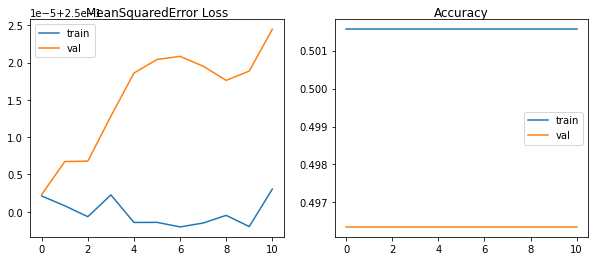

2022-07-23 18:46:13 Train Accuracy: 0.5015624761581421
2022-07-23 18:46:13 Val Accuracy: 0.49635568261146545
2022-07-23 18:46:13 Test Accuracy: 0.5


Test Accuracy,0.5
Train Accuracy,0.50156
Val Accuracy,0.49636


wandb: Agent Starting Run: ej741xt3 with config:
wandb: 	batch_size: 230
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.4
wandb: 	initializer: zeros
wandb: 	layers: 4
wandb: 	learning_rate: 0.01
wandb: 	momentum: 0.9
wandb: 	nodes: 87
wandb: 	optimizer: adam
wandb: 	overfit_preventing: dropout


2022-07-23 18:46:30 Creating Datasets
2022-07-23 18:46:30 Creating Preprocessors
2022-07-23 18:47:48 Creating and Compiling the Model
2022-07-23 18:47:48 Trainning


Epoch 15: early stopping


2022-07-23 18:48:06 Infering
2022-07-23 18:48:08 Creating Figures


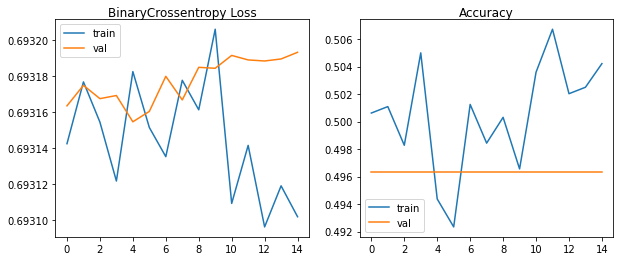

2022-07-23 18:48:09 Train Accuracy: 0.5015624761581421
2022-07-23 18:48:09 Val Accuracy: 0.49635568261146545
2022-07-23 18:48:09 Test Accuracy: 0.5


Test Accuracy,0.5
Train Accuracy,0.50156
Val Accuracy,0.49636


wandb: Agent Starting Run: n3chptlv with config:
wandb: 	batch_size: 2286
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.2
wandb: 	initializer: zeros
wandb: 	layers: 4
wandb: 	learning_rate: 0.01
wandb: 	momentum: 0.9
wandb: 	nodes: 22
wandb: 	optimizer: adam
wandb: 	overfit_preventing: dropout


2022-07-23 18:48:27 Creating Datasets
2022-07-23 18:48:27 Creating Preprocessors
2022-07-23 18:49:39 Creating and Compiling the Model
2022-07-23 18:49:40 Trainning


Epoch 23: early stopping


2022-07-23 18:50:07 Infering
2022-07-23 18:50:09 Creating Figures


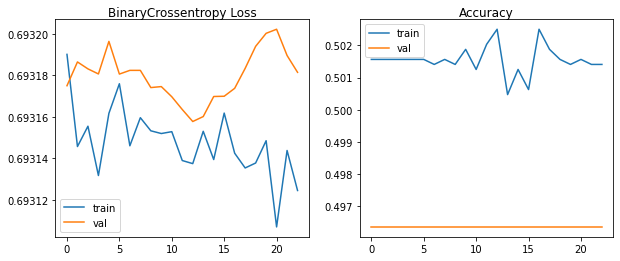

2022-07-23 18:50:10 Train Accuracy: 0.5015624761581421
2022-07-23 18:50:10 Val Accuracy: 0.49635568261146545
2022-07-23 18:50:10 Test Accuracy: 0.5


Test Accuracy,0.5
Train Accuracy,0.50156
Val Accuracy,0.49636


wandb: Agent Starting Run: 3bkkkk5k with config:
wandb: 	batch_size: 570
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.4
wandb: 	initializer: zeros
wandb: 	layers: 4
wandb: 	learning_rate: 0.01
wandb: 	momentum: 0.9
wandb: 	nodes: 44
wandb: 	optimizer: sgd
wandb: 	overfit_preventing: dropout


2022-07-23 18:50:24 Creating Datasets
2022-07-23 18:50:25 Creating Preprocessors
2022-07-23 18:51:36 Creating and Compiling the Model
2022-07-23 18:51:37 Trainning


Epoch 11: early stopping


2022-07-23 18:51:50 Infering
2022-07-23 18:51:53 Creating Figures


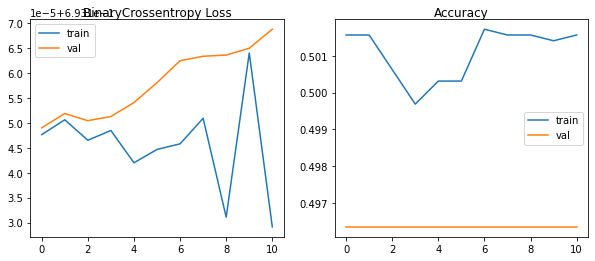

2022-07-23 18:51:53 Train Accuracy: 0.5015624761581421
2022-07-23 18:51:53 Val Accuracy: 0.49635568261146545
2022-07-23 18:51:53 Test Accuracy: 0.5


Test Accuracy,0.5
Train Accuracy,0.50156
Val Accuracy,0.49636


wandb: Agent Starting Run: fy4m6pcr with config:
wandb: 	batch_size: 2286
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.2
wandb: 	initializer: random
wandb: 	layers: 2
wandb: 	learning_rate: 0.05
wandb: 	momentum: 0.9
wandb: 	nodes: 87
wandb: 	optimizer: sgd
wandb: 	overfit_preventing: weight_cons


2022-07-23 18:52:11 Creating Datasets
2022-07-23 18:52:11 Creating Preprocessors
2022-07-23 18:53:24 Creating and Compiling the Model
2022-07-23 18:53:24 Trainning


Epoch 94: early stopping


2022-07-23 18:55:04 Infering
2022-07-23 18:55:07 Creating Figures


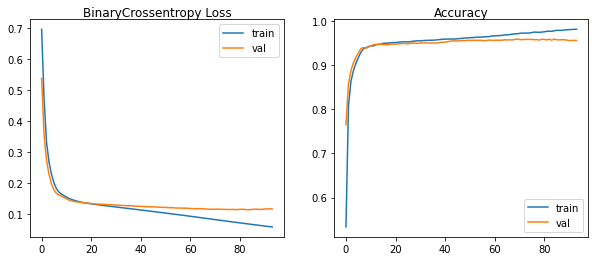

2022-07-23 18:55:07 Train Accuracy: 0.9828125238418579
2022-07-23 18:55:07 Val Accuracy: 0.9562682509422302
2022-07-23 18:55:07 Test Accuracy: 0.9514435529708862


Test Accuracy,0.95144
Train Accuracy,0.98281
Val Accuracy,0.95627


wandb: Agent Starting Run: ck0lz0lf with config:
wandb: 	batch_size: 570
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.2
wandb: 	initializer: random
wandb: 	layers: 2
wandb: 	learning_rate: 0.01
wandb: 	momentum: 0.9
wandb: 	nodes: 44
wandb: 	optimizer: adagrad
wandb: 	overfit_preventing: l2


2022-07-23 18:55:25 Creating Datasets
2022-07-23 18:55:25 Creating Preprocessors
2022-07-23 18:56:36 Creating and Compiling the Model
2022-07-23 18:56:36 Trainning
2022-07-23 19:00:08 Infering
2022-07-23 19:00:10 Creating Figures


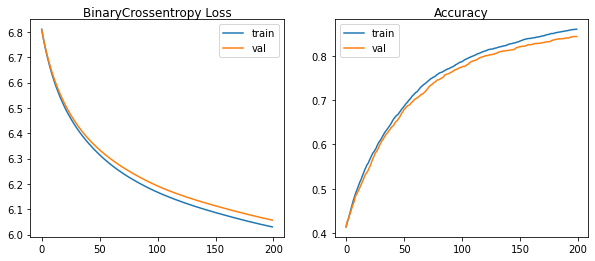

2022-07-23 19:00:10 Train Accuracy: 0.8598437309265137
2022-07-23 19:00:10 Val Accuracy: 0.8432944416999817
2022-07-23 19:00:10 Test Accuracy: 0.8320209980010986


Test Accuracy,0.83202
Train Accuracy,0.85984
Val Accuracy,0.84329


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: j7nhmdek with config:
wandb: 	batch_size: 570
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.4
wandb: 	initializer: zeros
wandb: 	layers: 1
wandb: 	learning_rate: 0.01
wandb: 	momentum: 0.9
wandb: 	nodes: 44
wandb: 	optimizer: adam
wandb: 	overfit_preventing: l2


2022-07-23 19:00:34 Creating Datasets
2022-07-23 19:00:35 Creating Preprocessors
2022-07-23 19:01:48 Creating and Compiling the Model
2022-07-23 19:01:48 Trainning


Epoch 115: early stopping


2022-07-23 19:03:50 Infering
2022-07-23 19:03:54 Creating Figures


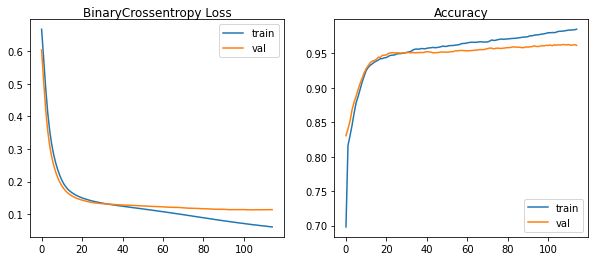

2022-07-23 19:03:54 Train Accuracy: 0.9854687452316284
2022-07-23 19:03:54 Val Accuracy: 0.9617347121238708
2022-07-23 19:03:54 Test Accuracy: 0.9514435529708862


Test Accuracy,0.95144
Train Accuracy,0.98547
Val Accuracy,0.96173


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 52z086z5 with config:
wandb: 	batch_size: 1143
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.2
wandb: 	initializer: zeros
wandb: 	layers: 4
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 87
wandb: 	optimizer: adagrad
wandb: 	overfit_preventing: dropout


2022-07-23 19:04:18 Creating Datasets
2022-07-23 19:04:19 Creating Preprocessors
2022-07-23 19:05:31 Creating and Compiling the Model
2022-07-23 19:05:31 Trainning


Epoch 11: early stopping


2022-07-23 19:05:47 Infering
2022-07-23 19:05:49 Creating Figures


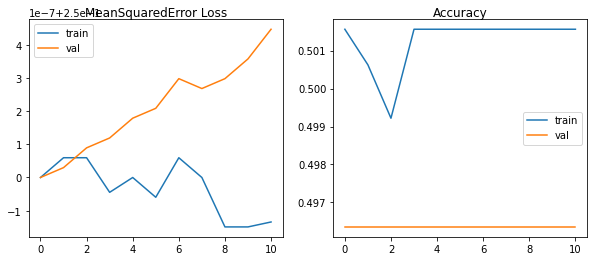

2022-07-23 19:05:50 Train Accuracy: 0.5015624761581421
2022-07-23 19:05:50 Val Accuracy: 0.49635568261146545
2022-07-23 19:05:50 Test Accuracy: 0.5


Test Accuracy,0.5
Train Accuracy,0.50156
Val Accuracy,0.49636


wandb: Agent Starting Run: bjafjth7 with config:
wandb: 	batch_size: 2286
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.4
wandb: 	initializer: zeros
wandb: 	layers: 3
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 87
wandb: 	optimizer: adagrad
wandb: 	overfit_preventing: weight_cons


2022-07-23 19:06:06 Creating Datasets
2022-07-23 19:06:06 Creating Preprocessors
2022-07-23 19:07:19 Creating and Compiling the Model
2022-07-23 19:07:19 Trainning
2022-07-23 19:10:49 Infering
2022-07-23 19:10:51 Creating Figures


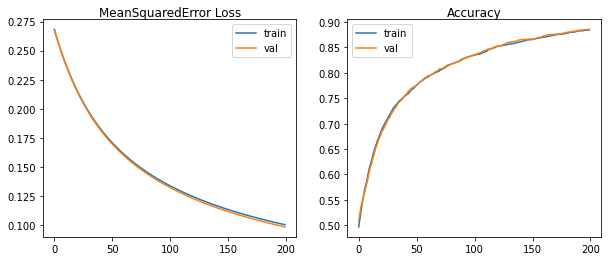

2022-07-23 19:10:51 Train Accuracy: 0.8843749761581421
2022-07-23 19:10:51 Val Accuracy: 0.8859329223632812
2022-07-23 19:10:51 Test Accuracy: 0.8748906254768372


Test Accuracy,0.87489
Train Accuracy,0.88437
Val Accuracy,0.88593


wandb: Agent Starting Run: nps87j6l with config:
wandb: 	batch_size: 1143
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.2
wandb: 	initializer: zeros
wandb: 	layers: 2
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 44
wandb: 	optimizer: rmsprop
wandb: 	overfit_preventing: weight_cons


2022-07-23 19:11:06 Creating Datasets
2022-07-23 19:11:06 Creating Preprocessors
2022-07-23 19:12:17 Creating and Compiling the Model
2022-07-23 19:12:18 Trainning


Epoch 84: early stopping


2022-07-23 19:13:48 Infering
2022-07-23 19:13:50 Creating Figures


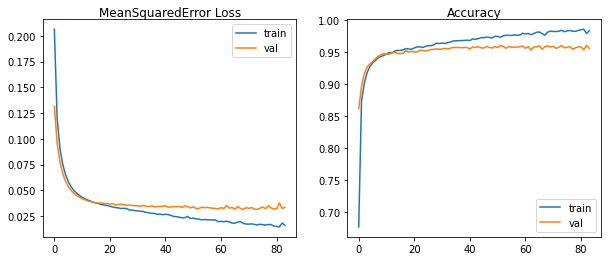

2022-07-23 19:13:50 Train Accuracy: 0.9832812547683716
2022-07-23 19:13:50 Val Accuracy: 0.9551749229431152
2022-07-23 19:13:50 Test Accuracy: 0.946631669998169


Test Accuracy,0.94663
Train Accuracy,0.98328
Val Accuracy,0.95517


wandb: Agent Starting Run: q21blg5z with config:
wandb: 	batch_size: 570
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.4
wandb: 	initializer: random
wandb: 	layers: 4
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 87
wandb: 	optimizer: sgd
wandb: 	overfit_preventing: l2


2022-07-23 19:14:10 Creating Datasets
2022-07-23 19:14:10 Creating Preprocessors
2022-07-23 19:15:22 Creating and Compiling the Model
2022-07-23 19:15:23 Trainning
2022-07-23 19:18:55 Infering
2022-07-23 19:18:57 Creating Figures


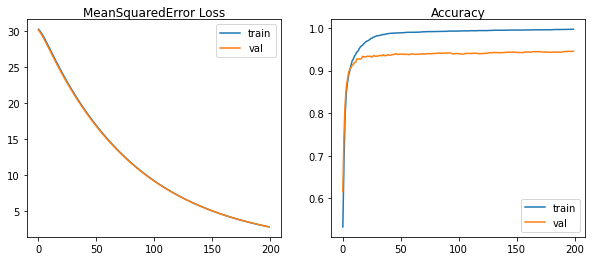

2022-07-23 19:18:58 Train Accuracy: 0.9970312714576721
2022-07-23 19:18:58 Val Accuracy: 0.9453352689743042
2022-07-23 19:18:58 Test Accuracy: 0.9370078444480896


Test Accuracy,0.93701
Train Accuracy,0.99703
Val Accuracy,0.94534


wandb: Agent Starting Run: awf31vlo with config:
wandb: 	batch_size: 230
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.2
wandb: 	initializer: random
wandb: 	layers: 2
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 87
wandb: 	optimizer: adagrad
wandb: 	overfit_preventing: l2


2022-07-23 19:19:15 Creating Datasets
2022-07-23 19:19:15 Creating Preprocessors
2022-07-23 19:20:29 Creating and Compiling the Model
2022-07-23 19:20:29 Trainning
2022-07-23 19:23:58 Infering
2022-07-23 19:24:00 Creating Figures


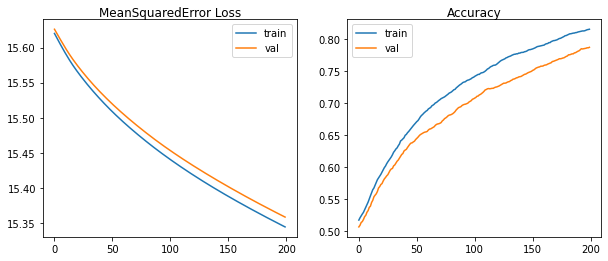

2022-07-23 19:24:01 Train Accuracy: 0.815625011920929
2022-07-23 19:24:01 Val Accuracy: 0.7871720194816589
2022-07-23 19:24:01 Test Accuracy: 0.7869641184806824


Test Accuracy,0.78696
Train Accuracy,0.81563
Val Accuracy,0.78717


wandb: Agent Starting Run: ijeq8ryf with config:
wandb: 	batch_size: 1143
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.2
wandb: 	initializer: zeros
wandb: 	layers: 4
wandb: 	learning_rate: 0.05
wandb: 	momentum: 0.9
wandb: 	nodes: 87
wandb: 	optimizer: adagrad
wandb: 	overfit_preventing: dropout


2022-07-23 19:24:16 Creating Datasets
2022-07-23 19:24:17 Creating Preprocessors
2022-07-23 19:25:29 Creating and Compiling the Model
2022-07-23 19:25:29 Trainning


Epoch 11: early stopping


2022-07-23 19:25:43 Infering
2022-07-23 19:25:45 Creating Figures


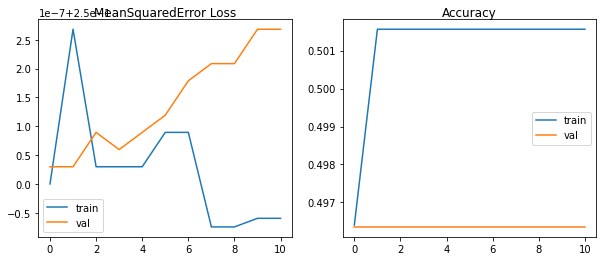

2022-07-23 19:25:46 Train Accuracy: 0.5015624761581421
2022-07-23 19:25:46 Val Accuracy: 0.49635568261146545
2022-07-23 19:25:46 Test Accuracy: 0.5


Test Accuracy,0.5
Train Accuracy,0.50156
Val Accuracy,0.49636


wandb: Agent Starting Run: fyyp7xq1 with config:
wandb: 	batch_size: 2286
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.2
wandb: 	initializer: zeros
wandb: 	layers: 2
wandb: 	learning_rate: 0.01
wandb: 	momentum: 0.9
wandb: 	nodes: 174
wandb: 	optimizer: rmsprop
wandb: 	overfit_preventing: dropout


2022-07-23 19:26:04 Creating Datasets
2022-07-23 19:26:04 Creating Preprocessors
2022-07-23 19:27:17 Creating and Compiling the Model
2022-07-23 19:27:17 Trainning


Epoch 16: early stopping


2022-07-23 19:27:37 Infering
2022-07-23 19:27:40 Creating Figures


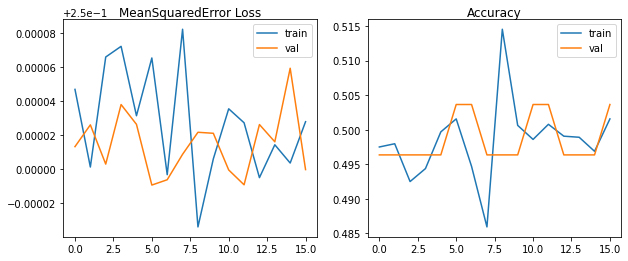

2022-07-23 19:27:41 Train Accuracy: 0.4984374940395355
2022-07-23 19:27:41 Val Accuracy: 0.5036442875862122
2022-07-23 19:27:41 Test Accuracy: 0.5


Test Accuracy,0.5
Train Accuracy,0.49844
Val Accuracy,0.50364


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 10p1gvvf with config:
wandb: 	batch_size: 2286
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.4
wandb: 	initializer: zeros
wandb: 	layers: 4
wandb: 	learning_rate: 0.05
wandb: 	momentum: 0.9
wandb: 	nodes: 22
wandb: 	optimizer: rmsprop
wandb: 	overfit_preventing: dropout


2022-07-23 19:28:05 Creating Datasets
2022-07-23 19:28:06 Creating Preprocessors
2022-07-23 19:29:19 Creating and Compiling the Model
2022-07-23 19:29:19 Trainning


Epoch 16: early stopping


2022-07-23 19:29:38 Infering
2022-07-23 19:29:41 Creating Figures


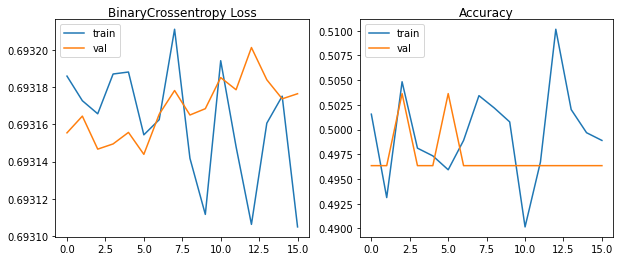

2022-07-23 19:29:41 Train Accuracy: 0.5015624761581421
2022-07-23 19:29:41 Val Accuracy: 0.49635568261146545
2022-07-23 19:29:41 Test Accuracy: 0.5


Test Accuracy,0.5
Train Accuracy,0.50156
Val Accuracy,0.49636


wandb: Agent Starting Run: 5k85919o with config:
wandb: 	batch_size: 2286
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.4
wandb: 	initializer: zeros
wandb: 	layers: 1
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 174
wandb: 	optimizer: sgd
wandb: 	overfit_preventing: l2


2022-07-23 19:29:59 Creating Datasets
2022-07-23 19:29:59 Creating Preprocessors
2022-07-23 19:31:12 Creating and Compiling the Model
2022-07-23 19:31:12 Trainning


Epoch 70: early stopping


2022-07-23 19:32:27 Infering
2022-07-23 19:32:30 Creating Figures


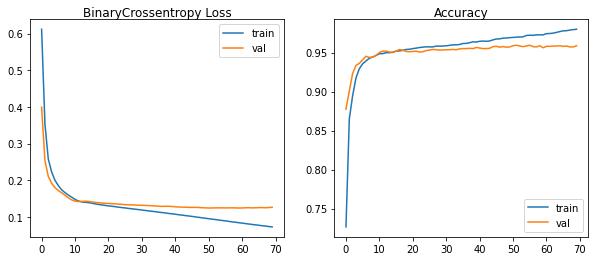

2022-07-23 19:32:30 Train Accuracy: 0.9806249737739563
2022-07-23 19:32:30 Val Accuracy: 0.9588192701339722
2022-07-23 19:32:30 Test Accuracy: 0.9492563605308533


Test Accuracy,0.94926
Train Accuracy,0.98062
Val Accuracy,0.95882


wandb: Agent Starting Run: kafzhag2 with config:
wandb: 	batch_size: 230
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.2
wandb: 	initializer: random
wandb: 	layers: 2
wandb: 	learning_rate: 0.01
wandb: 	momentum: 0.9
wandb: 	nodes: 87
wandb: 	optimizer: rmsprop
wandb: 	overfit_preventing: weight_cons


2022-07-23 19:32:48 Creating Datasets
2022-07-23 19:32:48 Creating Preprocessors
2022-07-23 19:34:01 Creating and Compiling the Model
2022-07-23 19:34:01 Trainning


Epoch 34: early stopping


2022-07-23 19:34:40 Infering
2022-07-23 19:34:42 Creating Figures


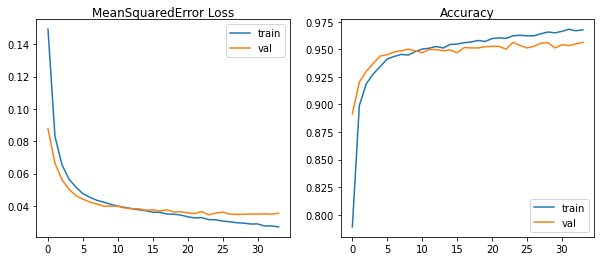

2022-07-23 19:34:42 Train Accuracy: 0.9668750166893005
2022-07-23 19:34:42 Val Accuracy: 0.9562682509422302
2022-07-23 19:34:42 Test Accuracy: 0.9492563605308533


Test Accuracy,0.94926
Train Accuracy,0.96688
Val Accuracy,0.95627


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: u6thqvva with config:
wandb: 	batch_size: 2286
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.2
wandb: 	initializer: zeros
wandb: 	layers: 3
wandb: 	learning_rate: 0.05
wandb: 	momentum: 0.9
wandb: 	nodes: 87
wandb: 	optimizer: adagrad
wandb: 	overfit_preventing: dropout


2022-07-23 19:35:09 Creating Datasets
2022-07-23 19:35:09 Creating Preprocessors
2022-07-23 19:36:20 Creating and Compiling the Model
2022-07-23 19:36:20 Trainning


Epoch 11: early stopping


2022-07-23 19:36:35 Infering
2022-07-23 19:36:38 Creating Figures


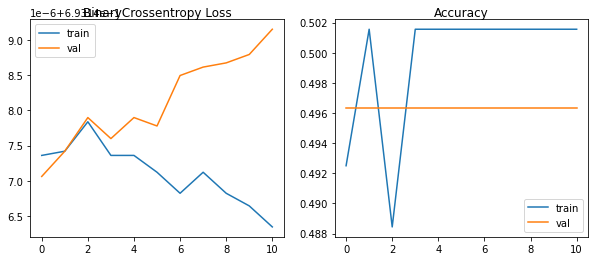

2022-07-23 19:36:38 Train Accuracy: 0.5015624761581421
2022-07-23 19:36:38 Val Accuracy: 0.49635568261146545
2022-07-23 19:36:38 Test Accuracy: 0.5


Test Accuracy,0.5
Train Accuracy,0.50156
Val Accuracy,0.49636


wandb: Agent Starting Run: 9kzf9u28 with config:
wandb: 	batch_size: 1143
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.4
wandb: 	initializer: random
wandb: 	layers: 4
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 22
wandb: 	optimizer: sgd
wandb: 	overfit_preventing: weight_cons


2022-07-23 19:36:56 Creating Datasets
2022-07-23 19:36:56 Creating Preprocessors
2022-07-23 19:38:07 Creating and Compiling the Model
2022-07-23 19:38:07 Trainning


Epoch 50: early stopping


2022-07-23 19:38:59 Infering
2022-07-23 19:39:02 Creating Figures


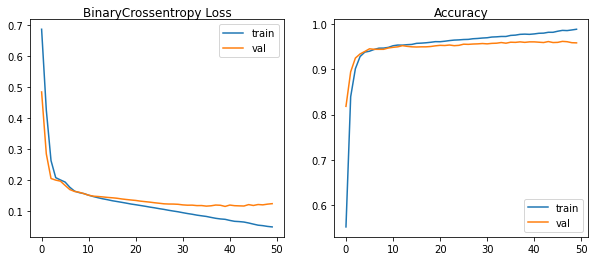

2022-07-23 19:39:02 Train Accuracy: 0.9892187714576721
2022-07-23 19:39:02 Val Accuracy: 0.9580903649330139
2022-07-23 19:39:02 Test Accuracy: 0.9488189220428467


Test Accuracy,0.94882
Train Accuracy,0.98922
Val Accuracy,0.95809


wandb: Agent Starting Run: z2jpqdj0 with config:
wandb: 	batch_size: 570
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.2
wandb: 	initializer: zeros
wandb: 	layers: 4
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 174
wandb: 	optimizer: sgd
wandb: 	overfit_preventing: weight_cons


2022-07-23 19:39:18 Creating Datasets
2022-07-23 19:39:18 Creating Preprocessors
2022-07-23 19:40:29 Creating and Compiling the Model
2022-07-23 19:40:29 Trainning


Epoch 106: early stopping


2022-07-23 19:42:29 Infering
2022-07-23 19:42:31 Creating Figures


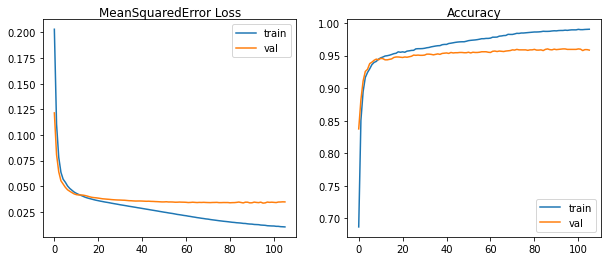

2022-07-23 19:42:31 Train Accuracy: 0.9904687404632568
2022-07-23 19:42:31 Val Accuracy: 0.9584547877311707
2022-07-23 19:42:31 Test Accuracy: 0.9540682435035706


Test Accuracy,0.95407
Train Accuracy,0.99047
Val Accuracy,0.95845


wandb: Agent Starting Run: 20w6ph0d with config:
wandb: 	batch_size: 2286
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.4
wandb: 	initializer: random
wandb: 	layers: 4
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 87
wandb: 	optimizer: adagrad
wandb: 	overfit_preventing: weight_cons


2022-07-23 19:42:47 Creating Datasets
2022-07-23 19:42:47 Creating Preprocessors
2022-07-23 19:44:00 Creating and Compiling the Model
2022-07-23 19:44:00 Trainning
2022-07-23 19:47:34 Infering
2022-07-23 19:47:36 Creating Figures


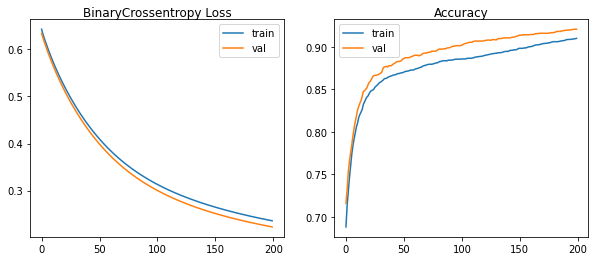

2022-07-23 19:47:37 Train Accuracy: 0.91015625
2022-07-23 19:47:37 Val Accuracy: 0.920918345451355
2022-07-23 19:47:37 Test Accuracy: 0.9151356220245361


Test Accuracy,0.91514
Train Accuracy,0.91016
Val Accuracy,0.92092


wandb: Agent Starting Run: bkdnplbn with config:
wandb: 	batch_size: 1143
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.4
wandb: 	initializer: random
wandb: 	layers: 1
wandb: 	learning_rate: 0.01
wandb: 	momentum: 0.9
wandb: 	nodes: 174
wandb: 	optimizer: adagrad
wandb: 	overfit_preventing: dropout


2022-07-23 19:47:53 Creating Datasets
2022-07-23 19:47:53 Creating Preprocessors
2022-07-23 19:49:06 Creating and Compiling the Model
2022-07-23 19:49:06 Trainning
2022-07-23 19:52:38 Infering
2022-07-23 19:52:41 Creating Figures


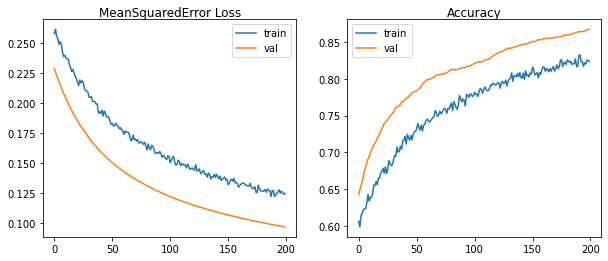

2022-07-23 19:52:41 Train Accuracy: 0.8607812523841858
2022-07-23 19:52:41 Val Accuracy: 0.8669825196266174
2022-07-23 19:52:41 Test Accuracy: 0.8512685894966125


Test Accuracy,0.85127
Train Accuracy,0.86078
Val Accuracy,0.86698


wandb: Agent Starting Run: dcc5obdw with config:
wandb: 	batch_size: 570
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.2
wandb: 	initializer: zeros
wandb: 	layers: 3
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 44
wandb: 	optimizer: adam
wandb: 	overfit_preventing: weight_cons


2022-07-23 19:52:59 Creating Datasets
2022-07-23 19:52:59 Creating Preprocessors
2022-07-23 19:54:11 Creating and Compiling the Model
2022-07-23 19:54:11 Trainning


Epoch 73: early stopping


2022-07-23 19:55:29 Infering
2022-07-23 19:55:32 Creating Figures


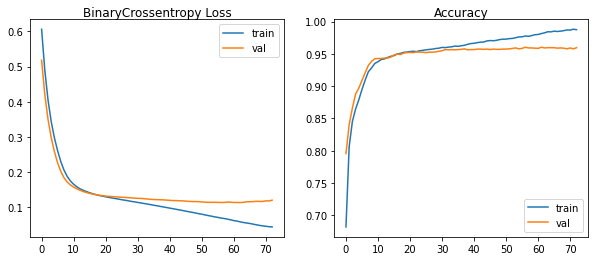

2022-07-23 19:55:33 Train Accuracy: 0.9879687428474426
2022-07-23 19:55:33 Val Accuracy: 0.9595481157302856
2022-07-23 19:55:33 Test Accuracy: 0.9496937990188599


Test Accuracy,0.94969
Train Accuracy,0.98797
Val Accuracy,0.95955


wandb: Agent Starting Run: 5auf9u3t with config:
wandb: 	batch_size: 230
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.2
wandb: 	initializer: zeros
wandb: 	layers: 2
wandb: 	learning_rate: 0.05
wandb: 	momentum: 0.9
wandb: 	nodes: 87
wandb: 	optimizer: rmsprop
wandb: 	overfit_preventing: weight_cons


2022-07-23 19:55:47 Creating Datasets
2022-07-23 19:55:47 Creating Preprocessors
2022-07-23 19:57:00 Creating and Compiling the Model
2022-07-23 19:57:00 Trainning


Epoch 57: early stopping


2022-07-23 19:58:03 Infering
2022-07-23 19:58:06 Creating Figures


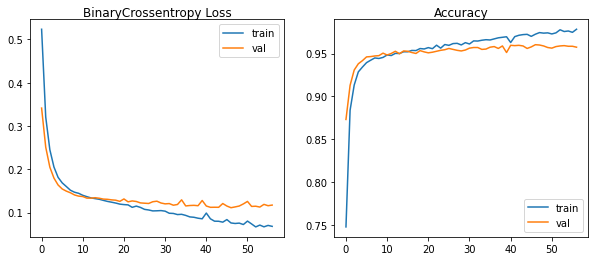

2022-07-23 19:58:07 Train Accuracy: 0.9785937666893005
2022-07-23 19:58:07 Val Accuracy: 0.9573615193367004
2022-07-23 19:58:07 Test Accuracy: 0.9496937990188599


Test Accuracy,0.94969
Train Accuracy,0.97859
Val Accuracy,0.95736


wandb: Agent Starting Run: 2l8uksim with config:
wandb: 	batch_size: 230
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.4
wandb: 	initializer: random
wandb: 	layers: 4
wandb: 	learning_rate: 0.01
wandb: 	momentum: 0.9
wandb: 	nodes: 22
wandb: 	optimizer: adagrad
wandb: 	overfit_preventing: l2


2022-07-23 19:58:25 Creating Datasets
2022-07-23 19:58:25 Creating Preprocessors
2022-07-23 19:59:37 Creating and Compiling the Model
2022-07-23 19:59:37 Trainning
2022-07-23 20:03:07 Infering
2022-07-23 20:03:09 Creating Figures


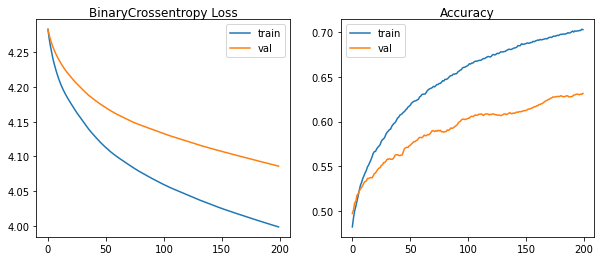

2022-07-23 20:03:09 Train Accuracy: 0.7035937309265137
2022-07-23 20:03:09 Val Accuracy: 0.6315597891807556
2022-07-23 20:03:09 Test Accuracy: 0.6006124019622803


Test Accuracy,0.60061
Train Accuracy,0.70359
Val Accuracy,0.63156


wandb: Agent Starting Run: 0gteytr2 with config:
wandb: 	batch_size: 2286
wandb: 	criterion: BinaryCrossentropy
wandb: 	dropout: 0.4
wandb: 	initializer: zeros
wandb: 	layers: 1
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 44
wandb: 	optimizer: adam
wandb: 	overfit_preventing: dropout


2022-07-23 20:03:26 Creating Datasets
2022-07-23 20:03:26 Creating Preprocessors
2022-07-23 20:04:37 Creating and Compiling the Model
2022-07-23 20:04:37 Trainning


Epoch 117: early stopping


2022-07-23 20:06:39 Infering
2022-07-23 20:06:41 Creating Figures


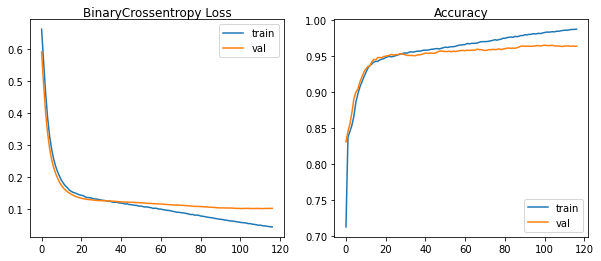

2022-07-23 20:06:41 Train Accuracy: 0.9878125190734863
2022-07-23 20:06:41 Val Accuracy: 0.963921308517456
2022-07-23 20:06:41 Test Accuracy: 0.9514435529708862


Test Accuracy,0.95144
Train Accuracy,0.98781
Val Accuracy,0.96392


wandb: Agent Starting Run: sfyr49ty with config:
wandb: 	batch_size: 230
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.2
wandb: 	initializer: zeros
wandb: 	layers: 4
wandb: 	learning_rate: 0.01
wandb: 	momentum: 0.9
wandb: 	nodes: 44
wandb: 	optimizer: adagrad
wandb: 	overfit_preventing: weight_cons


2022-07-23 20:06:59 Creating Datasets
2022-07-23 20:06:59 Creating Preprocessors
2022-07-23 20:08:11 Creating and Compiling the Model
2022-07-23 20:08:11 Trainning
2022-07-23 20:11:36 Infering
2022-07-23 20:11:39 Creating Figures


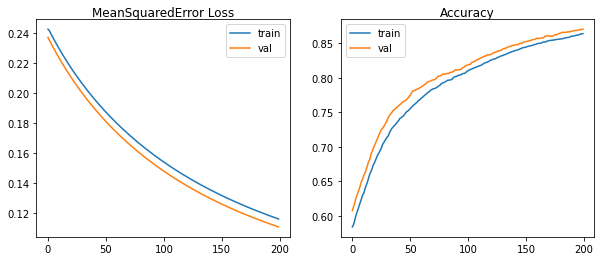

2022-07-23 20:11:39 Train Accuracy: 0.8642187714576721
2022-07-23 20:11:39 Val Accuracy: 0.8706268072128296
2022-07-23 20:11:39 Test Accuracy: 0.8556430339813232


Test Accuracy,0.85564
Train Accuracy,0.86422
Val Accuracy,0.87063


wandb: Agent Starting Run: yx6tvs28 with config:
wandb: 	batch_size: 2286
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.2
wandb: 	initializer: random
wandb: 	layers: 1
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 174
wandb: 	optimizer: sgd
wandb: 	overfit_preventing: weight_cons


2022-07-23 20:11:54 Creating Datasets
2022-07-23 20:11:54 Creating Preprocessors
2022-07-23 20:13:08 Creating and Compiling the Model
2022-07-23 20:13:08 Trainning
2022-07-23 20:16:38 Infering
2022-07-23 20:16:40 Creating Figures


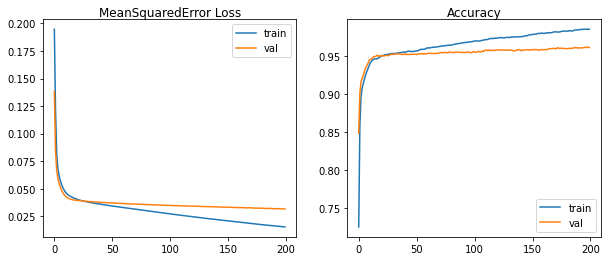

2022-07-23 20:16:41 Train Accuracy: 0.9850000143051147
2022-07-23 20:16:41 Val Accuracy: 0.9606413841247559
2022-07-23 20:16:41 Test Accuracy: 0.9545056819915771


Test Accuracy,0.95451
Train Accuracy,0.985
Val Accuracy,0.96064


wandb: Agent Starting Run: 4cl5l5ms with config:
wandb: 	batch_size: 2286
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.4
wandb: 	initializer: zeros
wandb: 	layers: 2
wandb: 	learning_rate: 0.1
wandb: 	momentum: 0.9
wandb: 	nodes: 174
wandb: 	optimizer: sgd
wandb: 	overfit_preventing: dropout


2022-07-23 20:16:56 Creating Datasets
2022-07-23 20:16:56 Creating Preprocessors
2022-07-23 20:18:08 Creating and Compiling the Model
2022-07-23 20:18:08 Trainning


Epoch 11: early stopping


2022-07-23 20:18:22 Infering
2022-07-23 20:18:25 Creating Figures


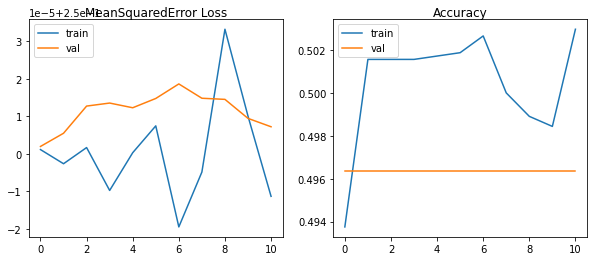

2022-07-23 20:18:26 Train Accuracy: 0.5015624761581421
2022-07-23 20:18:26 Val Accuracy: 0.49635568261146545
2022-07-23 20:18:26 Test Accuracy: 0.5


Test Accuracy,0.5
Train Accuracy,0.50156
Val Accuracy,0.49636


wandb: Agent Starting Run: 4iia3tp8 with config:
wandb: 	batch_size: 1143
wandb: 	criterion: MeanSquaredError
wandb: 	dropout: 0.2
wandb: 	initializer: zeros
wandb: 	layers: 3
wandb: 	learning_rate: 0.01
wandb: 	momentum: 0.9
wandb: 	nodes: 44
wandb: 	optimizer: rmsprop
wandb: 	overfit_preventing: weight_cons


2022-07-23 20:18:42 Creating Datasets
2022-07-23 20:18:43 Creating Preprocessors
2022-07-23 20:19:55 Creating and Compiling the Model
2022-07-23 20:19:55 Trainning


Epoch 43: early stopping


2022-07-23 20:20:41 Infering
2022-07-23 20:20:44 Creating Figures


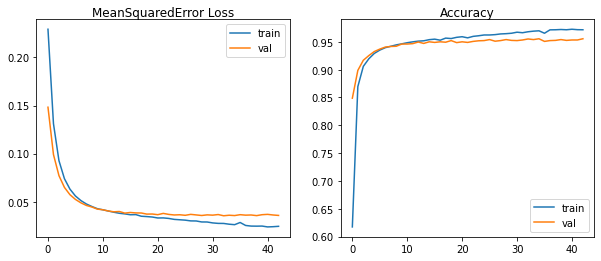

2022-07-23 20:20:44 Train Accuracy: 0.9759374856948853
2022-07-23 20:20:44 Val Accuracy: 0.955539345741272
2022-07-23 20:20:44 Test Accuracy: 0.953630805015564


Test Accuracy,0.95363
Train Accuracy,0.97594
Val Accuracy,0.95554


In [ ]:
wandb.agent(sweep_id, train_func, count=30)

In [ ]:
run.finish()

## 6.6 Configure and train the best model

IMPORTANT to restart the colab to unlink a new run.

In [ ]:
!wandb login --relogin

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
import logging
import wandb
import pandas as pd
import numpy as np
import joblib
import matplotlib.pyplot as plt

import tensorflow as tf

from tensorflow import feature_column
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2
from tensorflow.keras.constraints import unit_norm
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.neighbors import LocalOutlierFactor
#from sklearn.preprocessing import LabelEncoder
#from sklearn.preprocessing import OneHotEncoder
#from sklearn.base import BaseEstimator, TransformerMixin
#from sklearn.preprocessing import MinMaxScaler
#from sklearn.preprocessing import StandardScaler
#from sklearn.pipeline import Pipeline, FeatureUnion
#from sklearn.tree import DecisionTreeClassifier
#from sklearn.impute import SimpleImputer
from sklearn.metrics import fbeta_score, precision_score, recall_score, accuracy_score
#from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

# Defining Functions
def df_to_dataset(dataframe, shuffle=True, batch_size=32):
    dataframe = dataframe.copy()
    labels = dataframe.pop('target')
    df = {key: value[:,tf.newaxis] for key, value in dataframe.items()}
    ds = tf.data.Dataset.from_tensor_slices((dict(dataframe), labels))

    if shuffle:
        ds = ds.shuffle(buffer_size=len(dataframe))
    ds = ds.batch(batch_size)
    ds = ds.prefetch(batch_size)
    return ds

def get_normalization_layer(name, dataset):
    # Create a Normalization layer for the feature.
    normalizer = tf.keras.layers.Normalization(axis=None)

    # Prepare a Dataset that only yields the feature.
    feature_ds = dataset.map(lambda x, y: x[name])

    # Learn the statistics of the data.
    normalizer.adapt(feature_ds)

    return normalizer

# Initialize from scratch

# Read TRAIN data ==============================================================

#ratio used to split traind and validation data
val_size = 0.30

# seed used to reproduce purposes
seed = 57

# reference (column) to stratify the data
stratify = "status"

# name of the imput artifact
artifact_input_name = "phishing-detection-2/train.csv:latest"

# type of the artifact
artifact_type = "Train"

# configure logging
logging.basicConfig(level=logging.INFO,
                    format="%(asctime)s %(message)s",
                    datefmt="%Y-%m-%d %H:%M:%S")

# reference for a logging obj
logger = logging.getLogger()

# initiate the wandb project
run = wandb.init(project="phishing-detection-2",job_type="train")

logger.info("Downloading and reading the train artifact")
local_path = run.use_artifact(artifact_input_name).file()
df_train = pd.read_csv(local_path)

# Spliting train.csv into train and validation dataset
logger.info("Creating the target variable")

df_train['target'] = np.where(df_train[stratify]=='legitimate', 0, 1)

logger.info("Droping columns 'status' and 'url'")
df_train = df_train.drop(columns=['status', 'url'])

# Split data into Train and Validation =========================================

train, val = np.split(df_train.sample(frac=1), [int((1.-val_size)*len(df_train))])
logger.info("Train Samples:", len(train))
logger.info("Validation Samples:", len(val))

# Downloading Test Artifact ====================================================

logger.info("Downloading and reading the test artifact")
artifact_input_name = "phishing-detection-2/test.csv:latest"

local_path = run.use_artifact(artifact_input_name).file()
df_test = pd.read_csv(local_path)

df_test['target'] = np.where(df_test[stratify]=='legitimate', 0., 1.)

logger.info("Droping columns 'status' and 'url'")
df_test = df_test.drop(columns=['status', 'url'])

test_ds = df_to_dataset(df_test)
logger.info("Test Samples:", len(df_test))

logger.info('Creating Datasets')

wandb: WARNING Ignored wandb.init() arg project when running a sweep.


Test Accuracy,0.95276
Train Accuracy,0.98469
Val Accuracy,0.9508


2022-07-24 00:34:05 Downloading and reading the train artifact
2022-07-24 00:34:06 Creating the target variable
2022-07-24 00:34:06 Droping columns 'status' and 'url'
--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_ne

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
2022-07-24 00:36:11 Creating Preprocessors
2022-07-24 00:37:34 Creating and Compiling the Model
2022-07-24 00:37:34 Trainning
2022-07-24 00:41:13 Infering
2022-07-24 00:41:16 Creating Figures


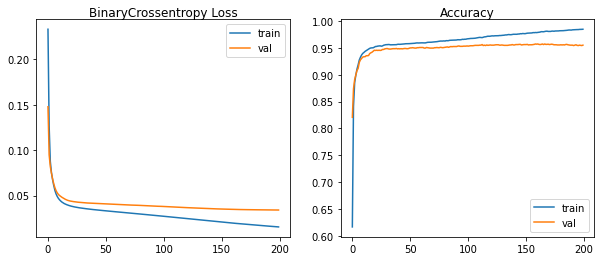

2022-07-24 00:41:16 Train Accuracy: 0.9845312237739563
2022-07-24 00:41:16 Val Accuracy: 0.9551749229431152
2022-07-24 00:41:16 Test Accuracy: 0.9540682435035706


In [ ]:
# Train Proccess ===============================================================

batch_size = 2286
criterion="MeanSquaredError"
dropout=0.2
initializer="random"
layers=1
learning_rate=0.1
momentum=0.9
nodes=174
optimizer="sgd"
overfit_preventing="weight_cons"

train_ds = df_to_dataset(train, batch_size=batch_size)
val_ds = df_to_dataset(val, batch_size=batch_size)
test_ds = df_to_dataset(df_test, batch_size=batch_size)

# Creating the Input Preprocessor --------------------------------------
logger.info('Creating Preprocessors')
all_inputs = []
encoded_features = []

numerical_features = train.select_dtypes(["int64","float"]).columns.to_list()
numerical_features.pop() # Remove ['target']

for header in numerical_features:
    numeric_col = tf.keras.Input(shape=(1,), name=header)
    normalization_layer = get_normalization_layer(header, train_ds)
    encoded_numeric_col = normalization_layer(numeric_col)
    all_inputs.append(numeric_col)
    encoded_features.append(encoded_numeric_col)

# Create, compile and train the model ----------------------------------
logger.info('Creating and Compiling the Model')
all_features = tf.keras.layers.concatenate(encoded_features)

x = tf.keras.layers.Dense(87,activation='tanh')(all_features)

for i in range(0, layers):

    init = None

    if initializer == "random":
        init = tf.keras.initializers.RandomNormal(mean=0,stddev=1)
    elif initializer == "zeros":
        init = tf.keras.initializers.Zeros()

    if overfit_preventing == "l2":
        x = tf.keras.layers.Dense(run.config.nodes,
                                  activation='tanh',
                                  kernel_regularizer=l2(0.001),
                                  kernel_initializer=init)(x)
    elif overfit_preventing == "dropout":
        x = tf.keras.layers.Dense(run.config.nodes,
                                  activation='tanh',
                                  kernel_initializer=init)(x)
        x = tf.keras.layers.Dropout(run.config.dropout)(x)
    elif overfit_preventing == "weight_cons":
        x = tf.keras.layers.Dense(run.config.nodes,
                                  activation='tanh',
                                  kernel_constraint=unit_norm())(x)

output = tf.keras.layers.Dense(1,activation='sigmoid')(x)

model = tf.keras.Model(all_inputs, output)

lf = None

if criterion == "BinaryCrossentropy":
    lf = tf.keras.losses.BinaryCrossentropy()
elif criterion == "MeanSquaredError":
    lf = tf.keras.losses.MeanSquaredError()

# Optimizers -----------------------------------------------------------
opt = optimizer
if opt == "sgd": 
    opt = SGD(learning_rate=learning_rate, momentum=momentum)

model.compile(loss=lf, metrics=["accuracy"], optimizer=opt)

# Trainning ------------------------------------------------------------
es = EarlyStopping(monitor='val_loss',
                    mode='min',
                    verbose=1,
                    patience=10)
logger.info('Trainning')
history = model.fit(train_ds,
                    epochs=200,
                    validation_data=val_ds,
                    verbose=0,
                    batch_size=batch_size,
                    callbacks=[es]
                    )

# Predict --------------------------------------------------------------
logger.info("Infering")
_, train_acc = model.evaluate(train_ds, verbose=0)
_, val_acc = model.evaluate(val_ds, verbose=0)
_, test_acc = model.evaluate(test_ds, verbose=0)

# Creating Figures -----------------------------------------------------
logger.info("Creating Figures")
fig, ax = plt.subplots(1,2, figsize=(10,4))

ax[0].set_title((run.config.criterion + " Loss"), pad=-40)
ax[0].plot(history.history['loss'], label='train')
ax[0].plot(history.history['val_loss'], label='val')
ax[0].legend(loc='best')

ax[1].set_title(("Accuracy"), pad=-40)
ax[1].plot(history.history['accuracy'], label='train')
ax[1].plot(history.history['val_accuracy'], label='val')
ax[1].legend(loc='best')

plt.show()
logger.info("Train Accuracy: {}".format(train_acc))
logger.info("Val Accuracy: {}".format(val_acc))
logger.info("Test Accuracy: {}".format(test_acc))

run.summary["Train Accuracy"] = train_acc
run.summary["Val Accuracy"] = val_acc
run.summary["Test Accuracy"] = test_acc

In [ ]:
# Visualize all classifier plots
# For a complete documentation please see: https://docs.wandb.ai/guides/integrations/scikit
wandb.sklearn.plot_classifier(pipe.get_params()["classifier"],
                              full_pipeline_preprocessing.transform(x_train),
                              full_pipeline_preprocessing.transform(x_val),
                              y_train,
                              y_val,
                              predict,
                              pipe.predict_proba(x_val),
                              [0,1],
                              model_name='BestModel', feature_names=all_names)

wandb: 
wandb: Plotting BestModel.
wandb: Logged feature importances.
wandb: Logged confusion matrix.
wandb: Logged summary metrics.
wandb: Logged class proportions.
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
wandb: Logged calibration curve.
wandb: WARNING wandb.plots.* functions are deprecated and will be removed in a future release. Please use wandb.plot.* instead.
wandb: Logged roc curve.
wandb: Logged precision-recall curve.


## 6.7 Export the Best Model

In [ ]:
# types and names of the artifacts
artifact_type = "inference_artifact"
artifact_encoder = "target_encoder"
artifact_model = "model_export"

In [ ]:
logger.info("Dumping the artifacts to disk")
# Save the model using joblib
joblib.dump(model, artifact_model)

2022-07-24 00:43:16 Dumping the artifacts to disk
2022-07-24 00:43:22 Function `_wrapped_model` contains input name(s) ratio_intHyperlinks, ratio_extHyperlinks, ratio_nullHyperlinks, nb_extCSS, ratio_intRedirection, ratio_extRedirection, ratio_intErrors, ratio_extErrors, ratio_intMedia, ratio_extMedia with unsupported characters which will be renamed to ratio_inthyperlinks, ratio_exthyperlinks, ratio_nullhyperlinks, nb_extcss, ratio_intredirection, ratio_extredirection, ratio_interrors, ratio_exterrors, ratio_intmedia, ratio_extmedia in the SavedModel.


INFO:tensorflow:Assets written to: ram://4a6750c5-141c-47e6-941a-a1e3f47aebfa/assets


2022-07-24 00:43:30 Assets written to: ram://4a6750c5-141c-47e6-941a-a1e3f47aebfa/assets


['model_export']

In [ ]:
# Model artifact
artifact = wandb.Artifact(artifact_model,
                          type=artifact_type,
                          description="A full pipeline composed of a Preprocessing Stage and a Decision Tree model"
                          )

logger.info("Logging model artifact")
artifact.add_file(artifact_model)
run.log_artifact(artifact)

2022-07-24 00:43:50 Logging model artifact


In [ ]:
# Target encoder artifact
artifact = wandb.Artifact(artifact_encoder,
                          type=artifact_type,
                          description="The encoder used to encode the target variable"
                          )

logger.info("Logging target enconder artifact")
artifact.add_file(artifact_encoder)
run.log_artifact(artifact)

2022-05-28 13:27:07 Logging target enconder artifact


In [ ]:
run.finish()

Test Accuracy,0.95407
Train Accuracy,0.98453
Val Accuracy,0.95517
